# Covid-19 severity assessment across the US:


## Covid-19 confirmed cases & deaths

Data were sourced from `Johns Hopkins University’s Center for Systems Science and Engineering` [CSSEGISandData/COVID-19](https://github.com/CSSEGISandData/COVID-19). Features included:

   - `FIPS` - missing for 10 counties.
   - `death_031021` and `cases_031021` extracted (no data on `Guam`)
   - `Population` from [Census data](https://www.census.gov/data/datasets/time-series/demo/popest/2010s-counties-total.html)
    
    
   - Link to our `vaccination_rate_US.csv` from the 3rd of October.
   
   
   - `death_031021` and `cases_031021` 0 for some states - assign these to NaNs

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import spearmanr

In [2]:
data = pd.read_csv('../data/clean/vaccination_rate_US.csv')

cases = pd.read_csv('../data/raw/covid19_confirmed_US.csv')
death = pd.read_csv('../data/raw/covid19_deaths_US.csv')

In [3]:
# longitudinal data, so large file
print('Confirmed cases:')
print(cases.columns)
print(len(cases.columns))

print('Covid-19 deaths:')
print(death.columns)
print(len(death.columns))

Confirmed cases:
Index(['UID', 'iso2', 'iso3', 'code3', 'FIPS', 'Admin2', 'Province_State',
       'Country_Region', 'Lat', 'Long_',
       ...
       '9/25/21', '9/26/21', '9/27/21', '9/28/21', '9/29/21', '9/30/21',
       '10/1/21', '10/2/21', '10/3/21', '10/4/21'],
      dtype='object', length=633)
633
Covid-19 deaths:
Index(['UID', 'iso2', 'iso3', 'code3', 'FIPS', 'Admin2', 'Province_State',
       'Country_Region', 'Lat', 'Long_',
       ...
       '9/25/21', '9/26/21', '9/27/21', '9/28/21', '9/29/21', '9/30/21',
       '10/1/21', '10/2/21', '10/3/21', '10/4/21'],
      dtype='object', length=634)
634


In [4]:
print(cases.columns[0:30])
print(death.columns[0:30])

Index(['UID', 'iso2', 'iso3', 'code3', 'FIPS', 'Admin2', 'Province_State',
       'Country_Region', 'Lat', 'Long_', 'Combined_Key', '1/22/20', '1/23/20',
       '1/24/20', '1/25/20', '1/26/20', '1/27/20', '1/28/20', '1/29/20',
       '1/30/20', '1/31/20', '2/1/20', '2/2/20', '2/3/20', '2/4/20', '2/5/20',
       '2/6/20', '2/7/20', '2/8/20', '2/9/20'],
      dtype='object')
Index(['UID', 'iso2', 'iso3', 'code3', 'FIPS', 'Admin2', 'Province_State',
       'Country_Region', 'Lat', 'Long_', 'Combined_Key', 'Population',
       '1/22/20', '1/23/20', '1/24/20', '1/25/20', '1/26/20', '1/27/20',
       '1/28/20', '1/29/20', '1/30/20', '1/31/20', '2/1/20', '2/2/20',
       '2/3/20', '2/4/20', '2/5/20', '2/6/20', '2/7/20', '2/8/20'],
      dtype='object')


#### Find unique column names between the dfs:

In [5]:
list(set(cases.columns).symmetric_difference(set(death.columns)))

['Population']

In [6]:
#death['Population'] = death['Population'].astype(int)
death['Population'].describe()

count    3.342000e+03
mean     9.960357e+04
std      3.241661e+05
min      0.000000e+00
25%      9.917250e+03
50%      2.489150e+04
75%      6.497525e+04
max      1.003911e+07
Name: Population, dtype: float64

In [7]:
cases[['UID', 'iso2', 'iso3', 'code3', 'FIPS', 'Admin2', 'Province_State',
       'Country_Region', 'Lat', 'Long_', 'Combined_Key', '10/3/21']].head(n = 5)

,UID,iso2,iso3,code3,FIPS,Admin2,Province_State,Country_Region,Lat,Long_,Combined_Key,10/3/21
0,84001001,US,USA,840,1001.0,Autauga,Alabama,US,32.539527,-86.644082,"Autauga, Alabama, US",9780
1,84001003,US,USA,840,1003.0,Baldwin,Alabama,US,30.727750,-87.722071,"Baldwin, Alabama, US",36579
2,84001005,US,USA,840,1005.0,Barbour,Alabama,US,31.868263,-85.387129,"Barbour, Alabama, US",3519
3,84001007,US,USA,840,1007.0,Bibb,Alabama,US,32.996421,-87.125115,"Bibb, Alabama, US",4157
4,84001009,US,USA,840,1009.0,Blount,Alabama,US,33.982109,-86.567906,"Blount, Alabama, US",9870


In [8]:
death[['UID', 'iso2', 'iso3', 'code3', 'FIPS', 'Admin2', 'Province_State',
       'Country_Region', 'Lat', 'Long_', 'Combined_Key', '10/3/21','Population']].head(n = 5)

,UID,iso2,iso3,code3,FIPS,Admin2,Province_State,Country_Region,Lat,Long_,Combined_Key,10/3/21,Population
0,84001001,US,USA,840,1001.0,Autauga,Alabama,US,32.539527,-86.644082,"Autauga, Alabama, US",142,55869
1,84001003,US,USA,840,1003.0,Baldwin,Alabama,US,30.727750,-87.722071,"Baldwin, Alabama, US",518,223234
2,84001005,US,USA,840,1005.0,Barbour,Alabama,US,31.868263,-85.387129,"Barbour, Alabama, US",71,24686
3,84001007,US,USA,840,1007.0,Bibb,Alabama,US,32.996421,-87.125115,"Bibb, Alabama, US",83,22394
4,84001009,US,USA,840,1009.0,Blount,Alabama,US,33.982109,-86.567906,"Blount, Alabama, US",162,57826


In [9]:
data.columns

Index(['fips', 'state', 'county', 'state_abb', 'popfull_per',
       'pop_full_12plus_per', 'pop_full_18plus_per', 'pop_full_65plus_per',
       'pop_first_per', 'pop_first_12plus_per', 'pop_first_18plus_per',
       'pop_first_65plus_per'],
      dtype='object')

In [10]:
cases_df = cases[['FIPS', 'Admin2', 'Province_State','Combined_Key', '10/3/21']]
death_df = death[['FIPS', 'Admin2', 'Province_State','Combined_Key', '10/3/21', 'Population']]

mapping = {'FIPS':'fips', 
          'Admin2':'county_death', 
          'Province_State':'state',
          'Combined_Key':'coun_state', 
          '10/3/21':'death_031021', 
          'Population': 'pop_census'}

death_df.rename(columns = mapping, inplace = True)

/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:4223: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().rename(**kwargs)


In [11]:
mapping = {'FIPS':'fips', 
          'Admin2':'county_cases', 
          'Province_State':'state',
          'Combined_Key':'coun_state', 
          '10/3/21':'cases_031021'}

cases_df.rename(columns = mapping, inplace = True)

In [12]:
cases_df.head(n = 3)

,fips,county_cases,state,coun_state,cases_031021
0,1001.0,Autauga,Alabama,"Autauga, Alabama, US",9780
1,1003.0,Baldwin,Alabama,"Baldwin, Alabama, US",36579
2,1005.0,Barbour,Alabama,"Barbour, Alabama, US",3519


In [13]:
print(cases_df.shape)
print(cases_df.isnull().sum())

(3342, 5)
fips            10
county_cases     6
state            0
coun_state       0
cases_031021     0
dtype: int64


In [14]:
cases_df[cases_df['fips'].isnull()]

,fips,county_cases,state,coun_state,cases_031021
1269,NaN,Dukes and Nantucket,Massachusetts,"Dukes and Nantucket,Massachusetts,US",3686
1306,NaN,Federal Correctional Institution (FCI),Michigan,"Federal Correctional Institution (FCI), Michig...",320
1338,NaN,Michigan Department of Corrections (MDOC),Michigan,"Michigan Department of Corrections (MDOC), Mic...",26942
1593,NaN,Kansas City,Missouri,"Kansas City,Missouri,US",61508
2956,NaN,Bear River,Utah,"Bear River, Utah, US",27993
2961,NaN,Central Utah,Utah,"Central Utah, Utah, US",12560
2980,NaN,Southeast Utah,Utah,"Southeast Utah, Utah, US",5135
2981,NaN,Southwest Utah,Utah,"Southwest Utah, Utah, US",38294
2984,NaN,TriCounty,Utah,"TriCounty, Utah, US",7454
2992,NaN,Weber-Morgan,Utah,"Weber-Morgan, Utah, US",40399


In [15]:
death_df.head(n = 3)

,fips,county_death,state,coun_state,death_031021,pop_census
0,1001.0,Autauga,Alabama,"Autauga, Alabama, US",142,55869
1,1003.0,Baldwin,Alabama,"Baldwin, Alabama, US",518,223234
2,1005.0,Barbour,Alabama,"Barbour, Alabama, US",71,24686


In [16]:
print(death_df.shape)
print(death_df.isnull().sum())

(3342, 6)
fips            10
county_death     6
state            0
coun_state       0
death_031021     0
pop_census       0
dtype: int64


In [17]:
death_df[death_df['fips'].isnull()]

,fips,county_death,state,coun_state,death_031021,pop_census
1269,NaN,Dukes and Nantucket,Massachusetts,"Dukes and Nantucket,Massachusetts,US",7,0
1306,NaN,Federal Correctional Institution (FCI),Michigan,"Federal Correctional Institution (FCI), Michig...",5,0
1338,NaN,Michigan Department of Corrections (MDOC),Michigan,"Michigan Department of Corrections (MDOC), Mic...",155,0
1593,NaN,Kansas City,Missouri,"Kansas City,Missouri,US",792,488943
2956,NaN,Bear River,Utah,"Bear River, Utah, US",137,0
2961,NaN,Central Utah,Utah,"Central Utah, Utah, US",97,0
2980,NaN,Southeast Utah,Utah,"Southeast Utah, Utah, US",38,0
2981,NaN,Southwest Utah,Utah,"Southwest Utah, Utah, US",358,0
2984,NaN,TriCounty,Utah,"TriCounty, Utah, US",58,0
2992,NaN,Weber-Morgan,Utah,"Weber-Morgan, Utah, US",279,0


### Convert `fips` to int to merge with vacc_rate data

*ignore warning message...*

In [18]:
cases_df['fips'] = cases_df['fips'].astype('Int64')
death_df['fips'] = death_df['fips'].astype('Int64')

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


### Merge cases + vacc_rate:

In [19]:
data_cases = pd.merge(data, cases_df[['fips','county_cases','cases_031021']].dropna(subset = ['fips']), 
         how = 'left', on = 'fips')

In [20]:
data_cases_death = pd.merge(data_cases, death_df[['fips','county_death','death_031021', 'pop_census']].dropna(subset = ['fips']), 
         how = 'left', on = 'fips')

In [21]:
data_cases_death.isnull().sum()

fips                      0
state                     0
county                    0
state_abb                 0
popfull_per               8
pop_full_12plus_per      53
pop_full_18plus_per     262
pop_full_65plus_per       8
pop_first_per           403
pop_first_12plus_per    281
pop_first_18plus_per    490
pop_first_65plus_per    236
county_cases              1
cases_031021              1
county_death              1
death_031021              1
pop_census                1
dtype: int64

#### One county is missing in the `data_cases_death`:

no data on `Guam`

In [22]:
data_cases_death[data_cases['county_cases'].isnull()]

,fips,state,county,state_abb,popfull_per,pop_full_12plus_per,pop_full_18plus_per,pop_full_65plus_per,pop_first_per,pop_first_12plus_per,pop_first_18plus_per,pop_first_65plus_per,county_cases,cases_031021,county_death,death_031021,pop_census
546,66010,Guam,Guam,GU,55.7,65.2,64.4,41.3,58.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [23]:
data_cases_death.shape

(3216, 17)

In [24]:
data_cases_death.head(n = 5)

,fips,state,county,state_abb,popfull_per,pop_full_12plus_per,pop_full_18plus_per,pop_full_65plus_per,pop_first_per,pop_first_12plus_per,pop_first_18plus_per,pop_first_65plus_per,county_cases,cases_031021,county_death,death_031021,pop_census
0,1001,Alabama,Autauga County,AL,34.0,39.9,41.8,61.7,43.1,50.6,52.6,74.5,Autauga,9780.0,Autauga,142.0,55869.0
1,1003,Alabama,Baldwin County,AL,42.7,49.5,51.9,75.3,54.4,63.0,65.7,91.1,Baldwin,36579.0,Baldwin,518.0,223234.0
2,1005,Alabama,Barbour County,AL,35.7,41.1,43.0,66.1,46.6,53.8,56.0,76.3,Barbour,3519.0,Barbour,71.0,24686.0
3,1007,Alabama,Bibb County,AL,29.7,34.2,35.7,57.0,37.3,42.8,44.7,64.5,Bibb,4157.0,Bibb,83.0,22394.0
4,1009,Alabama,Blount County,AL,26.4,31.0,32.9,49.5,32.8,38.5,40.6,57.3,Blount,9870.0,Blount,162.0,57826.0


In [25]:
def add_county(row):
    
    if type(row['county_cases']) == str:
        row['county_cases'] = row['county_cases'] + ' County'
        row['county_death'] = row['county_death'] + ' County'
        
    return row

data_cases_death = data_cases_death.apply(add_county, axis = 'columns')

In [26]:
data_cases_death[data_cases_death['county_death'].isnull()]

,fips,state,county,state_abb,popfull_per,pop_full_12plus_per,pop_full_18plus_per,pop_full_65plus_per,pop_first_per,pop_first_12plus_per,pop_first_18plus_per,pop_first_65plus_per,county_cases,cases_031021,county_death,death_031021,pop_census
546,66010,Guam,Guam,GU,55.7,65.2,64.4,41.3,58.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Check differences in county namings:

In [27]:
def check_counties(row):

    row['test'] = len(set([row['county'], row['county_cases'], row['county_death']]))   
    return(row)

data_cases_death = data_cases_death.apply(check_counties, axis = 'columns')

In [28]:
#test[test['verified'] == False][['fips','state','county','county_cases']].head(n = 5)
data_cases_death[data_cases_death['test'] > 1][['fips','state','county','county_cases','test']]

,fips,state,county,county_cases,test
67,2013,Alaska,Aleutians East Borough,Aleutians East County,2
68,2016,Alaska,Aleutians West Census Area,Aleutians West County,2
69,2020,Alaska,Anchorage Municipality,Anchorage County,2
70,2050,Alaska,Bethel Census Area,Bethel County,2
71,2060,Alaska,Bristol Bay Borough,Bristol Bay County,2
...,...,...,...,...,...
3022,51800,Virginia,Suffolk city,Suffolk County,2
3023,51810,Virginia,Virginia Beach city,Virginia Beach County,2
3024,51820,Virginia,Waynesboro city,Waynesboro County,2
3025,51830,Virginia,Williamsburg city,Williamsburg County,2


In [29]:
set(data_cases_death[data_cases_death['test'] > 1]['state'].tolist())

{'Alaska',
 'District of Columbia',
 'Guam',
 'Louisiana',
 'Maryland',
 'Missouri',
 'Nevada',
 'Puerto Rico',
 'Virginia'}

----
### Check individual states:


- `Alaska` - ok - to remove `Borough` / `Census Area` / `Lake and Peninsula Borough` (rename)
- `District of Columbia` - ok
- `Guam` - NaN
- `Louisiana` - `Parish` instead of `County`
- `Maryland` - `Baltimore city` vs	`Baltimore City County`
- `Missouri` - `St. Louis city` vs	`St. Louis City County`
- `Nevada` - `Carson City` vs `Carson City County`
- `Puerto Rico` - `Municipio` vs `County`
- `Virginia` - `city` vs `County`

### Overall, all good.

In [30]:
data_cases_death[(data_cases_death['test'] > 1) & 
                 (data_cases_death['state'] == 'Virginia')][['fips','state','county','county_cases','test']].head(n = 5)

,fips,state,county,county_cases,test
2989,51510,Virginia,Alexandria city,Alexandria County,2
2990,51520,Virginia,Bristol city,Bristol County,2
2991,51530,Virginia,Buena Vista city,Buena Vista County,2
2992,51540,Virginia,Charlottesville city,Charlottesville County,2
2993,51550,Virginia,Chesapeake city,Chesapeake County,2


## Check for missing data in cases and deaths:

- `cases` - 27 counties report 0 cases - NaN - Utah (22), Alaska (3), Massacgusetts (2)
- `death` - 133 counties report 0 death cases - how to confirm? States include:

`{'Alaska' (8), 
 'California' (2),
 'Colorado' (2),
 'Idaho'(1),
 'Massachusetts' (2),
 'Minnesota'(1),
 'Nebraska'(9),
 'Nevada'(2),
 'North Dakota' (2),
 'Puerto Rico' (78),
 'South Dakota'(1),
 'Texas' (2),
 'Utah' (20),
 'Washington' (1)}`
 
- assuming that the change of 0 deaths in US counties over the pandemic is very low, assinging 0s to NaN!

In [31]:
data_cases_death[data_cases_death['death_031021'] == 0].shape[0]
data_cases_death[(data_cases_death['death_031021'] == 0) & (data_cases_death['state'] == 'Washington')] #.shape[0]

#set(data_cases_death[data_cases_death['death_031021'] == 0]['state'])

,fips,state,county,state_abb,popfull_per,pop_full_12plus_per,pop_full_18plus_per,pop_full_65plus_per,pop_first_per,pop_first_12plus_per,pop_first_18plus_per,pop_first_65plus_per,county_cases,cases_031021,county_death,death_031021,pop_census,test
3054,53055,Washington,San Juan County,WA,73.3,79.5,79.7,82.2,77.3,83.8,83.8,82.8,San Juan County,293.0,San Juan County,0.0,17582.0,1


### Visualise the distribution of fully vaccinated individuals:

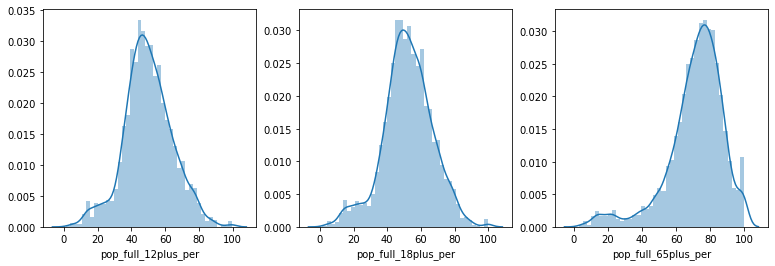

In [32]:
plt.figure(figsize=(13,4))

plt.subplot(1,3,1)
sns.distplot(data_cases_death[data_cases_death['pop_full_12plus_per'].notnull()]['pop_full_12plus_per'])


plt.subplot(1,3,2)
sns.distplot(data_cases_death[data_cases_death['pop_full_18plus_per'].notnull()]['pop_full_18plus_per'])

plt.subplot(1,3,3)
sns.distplot(data_cases_death[data_cases_death['pop_full_65plus_per'].notnull()]['pop_full_65plus_per'])

plt.show()

In [33]:
data_cases_death.head(n = 5)

,fips,state,county,state_abb,popfull_per,pop_full_12plus_per,pop_full_18plus_per,pop_full_65plus_per,pop_first_per,pop_first_12plus_per,pop_first_18plus_per,pop_first_65plus_per,county_cases,cases_031021,county_death,death_031021,pop_census,test
0,1001,Alabama,Autauga County,AL,34.0,39.9,41.8,61.7,43.1,50.6,52.6,74.5,Autauga County,9780.0,Autauga County,142.0,55869.0,1
1,1003,Alabama,Baldwin County,AL,42.7,49.5,51.9,75.3,54.4,63.0,65.7,91.1,Baldwin County,36579.0,Baldwin County,518.0,223234.0,1
2,1005,Alabama,Barbour County,AL,35.7,41.1,43.0,66.1,46.6,53.8,56.0,76.3,Barbour County,3519.0,Barbour County,71.0,24686.0,1
3,1007,Alabama,Bibb County,AL,29.7,34.2,35.7,57.0,37.3,42.8,44.7,64.5,Bibb County,4157.0,Bibb County,83.0,22394.0,1
4,1009,Alabama,Blount County,AL,26.4,31.0,32.9,49.5,32.8,38.5,40.6,57.3,Blount County,9870.0,Blount County,162.0,57826.0,1


### Visualise the distribution of `cases_031021` , `death_031021` and `pop_census`:

*Need to transform the variable for visualising:*

In [34]:
data_cases_death[['cases_031021','death_031021']].describe()

,cases_031021,death_031021
count,3.215000e+03,3215.000000
mean,1.342142e+04,208.967030
std,4.528948e+04,772.066763
min,0.000000e+00,0.000000
25%,1.445500e+03,23.000000
50%,3.492000e+03,58.000000
75%,9.075000e+03,142.000000
max,1.463039e+06,26153.000000


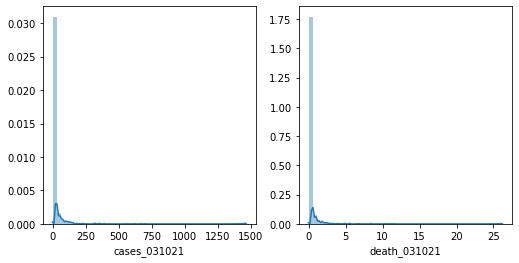

In [35]:
plt.figure(figsize=(13,4))

plt.subplot(1,3,1)
sns.distplot(data_cases_death[data_cases_death['cases_031021'].notnull()]['cases_031021'] * 0.001)

plt.subplot(1,3,2)
sns.distplot(data_cases_death[data_cases_death['death_031021'].notnull()]['death_031021'] * 0.001)

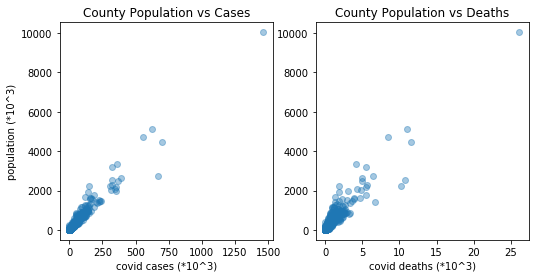

In [36]:
plt.figure(figsize=(13,4))

plt.subplot(1,3,1)
plt.scatter(data_cases_death['cases_031021'] * 0.001, data_cases_death['pop_census']* 0.001, alpha = 0.4)
plt.title('County Population vs Cases')
plt.ylabel('population (*10^3)')
plt.xlabel('covid cases (*10^3)')

plt.subplot(1,3,2)
plt.scatter(data_cases_death['death_031021']* 0.001, data_cases_death['pop_census']* 0.001, alpha = 0.4)
plt.title('County Population vs Deaths')
plt.xlabel('covid deaths (*10^3)')

plt.show()

### Look at outlier:

LA County has 10.04 mil population

In [37]:
data_cases_death[data_cases_death['pop_census'] > 6000000]

,fips,state,county,state_abb,popfull_per,pop_full_12plus_per,pop_full_18plus_per,pop_full_65plus_per,pop_first_per,pop_first_12plus_per,pop_first_18plus_per,pop_first_65plus_per,county_cases,cases_031021,county_death,death_031021,pop_census,test
204,6037,California,Los Angeles County,CA,59.9,69.7,70.5,77.1,68.8,79.9,80.7,89.1,Los Angeles County,1463039.0,Los Angeles County,26153.0,10039107.0,1


### Removing LA to visualise:

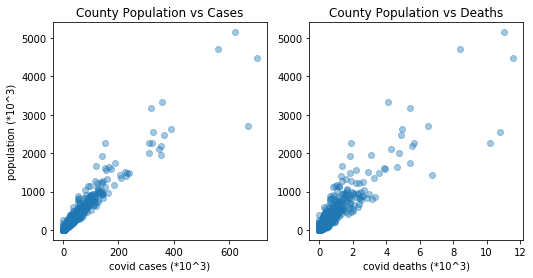

In [38]:
plt.figure(figsize=(13,4))

plt.subplot(1,3,1)
plt.scatter(data_cases_death[data_cases_death['pop_census'] < 6000000]['cases_031021'] * 0.001, 
            data_cases_death[data_cases_death['pop_census'] < 6000000]['pop_census']* 0.001, alpha = 0.4)
plt.title('County Population vs Cases')
plt.ylabel('population (*10^3)')
plt.xlabel('covid cases (*10^3)')

plt.subplot(1,3,2)
plt.scatter(data_cases_death[data_cases_death['pop_census'] < 6000000]['death_031021']* 0.001, 
            data_cases_death[data_cases_death['pop_census'] < 6000000]['pop_census']* 0.001, alpha = 0.4)
plt.title('County Population vs Deaths')
plt.xlabel('covid deaths (*10^3)')

plt.show()

### Correlation between `pop_census` & `cases`/`death`:

In [39]:
print('Correlation b/n population & cases {:2f}'.format(spearmanr(data_cases_death['pop_census'],
                                                                 data_cases_death['cases_031021'], 
                                                                 nan_policy = 'omit')[0]))

print('Correlation b/n population & cases {:2f}'.format(spearmanr(data_cases_death['pop_census'],
                                                                 data_cases_death['death_031021'], 
                                                                 nan_policy = 'omit')[0]))

Correlation b/n population & cases 0.954295
Correlation b/n population & cases 0.862579


### Plotting `cases/pop_cesus` and `death/pop_census`:

Text(0.5, 1.0, 'death / population')

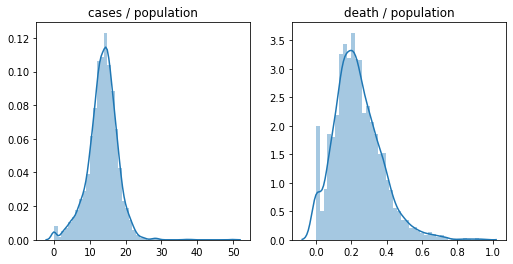

In [40]:
plt.figure(figsize=(13,4))

plt.subplot(1,3,1)
sns.distplot(data_cases_death[data_cases_death['cases_031021'].notnull()]['cases_031021']
             /data_cases_death[data_cases_death['cases_031021'].notnull()]['pop_census'] * 100)
plt.title('cases / population')

plt.subplot(1,3,2)
sns.distplot(data_cases_death[data_cases_death['death_031021'].notnull()]['death_031021']
             /data_cases_death[data_cases_death['death_031021'].notnull()]['pop_census'] * 100)
plt.title('death / population')

## Create new features:

- `cases_prop` - proportion of the population with covid
- `death_prop` - proportion of the population that died from covid

In [41]:
data_cases_death['cases_prop'] = data_cases_death['cases_031021'] / data_cases_death['pop_census'] *100
data_cases_death['death_prop'] = data_cases_death['death_031021'] / data_cases_death['pop_census'] *100

In [42]:
data_cases_death[['cases_prop','death_prop']].describe()

,cases_prop,death_prop
count,3215.000000,3215.000000
mean,13.579932,0.235541
std,4.114222,0.133208
min,0.000000,0.000000
25%,11.422517,0.146568
50%,13.829549,0.219514
75%,16.100296,0.311828
max,49.784542,0.942127


------------------
## Explore the association between vaccination rate and :

Need to assign 0s to NaN

- `cases_prop` - some negative overall association e.g., lower cases with higher vaccination rate... what a surprise 
- `death_prop` - some possible association, need to exclude 0s and investigate 100% vacc rate in over 65
   

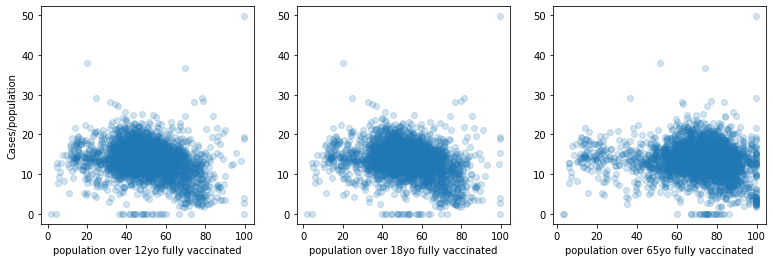

In [43]:
plt.figure(figsize=(13,4))

plt.subplot(1,3,1)
plt.scatter(data_cases_death['pop_full_12plus_per'], data_cases_death['cases_prop'], alpha = 0.2)
plt.ylabel('Cases/population')
plt.xlabel('population over 12yo fully vaccinated')

plt.subplot(1,3,2)
plt.scatter(data_cases_death['pop_full_18plus_per'], data_cases_death['cases_prop'], alpha = 0.2)
plt.xlabel('population over 18yo fully vaccinated')

plt.subplot(1,3,3)
plt.scatter(data_cases_death['pop_full_65plus_per'], data_cases_death['cases_prop'], alpha = 0.2)
plt.xlabel('population over 65yo fully vaccinated')

plt.show()

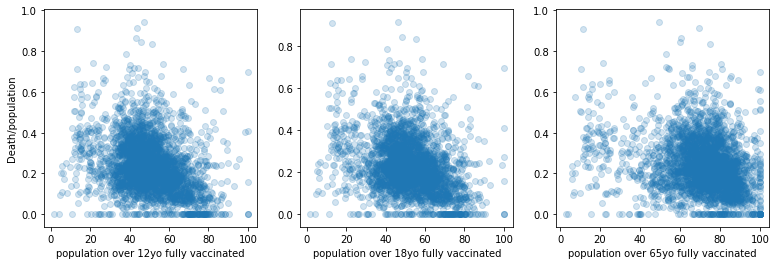

In [44]:
plt.figure(figsize=(13,4))

plt.subplot(1,3,1)
plt.scatter(data_cases_death['pop_full_12plus_per'], data_cases_death['death_prop'], alpha = 0.2)
plt.ylabel('Death/population')
plt.xlabel('population over 12yo fully vaccinated')

plt.subplot(1,3,2)
plt.scatter(data_cases_death['pop_full_18plus_per'], data_cases_death['death_prop'], alpha = 0.2)
plt.xlabel('population over 18yo fully vaccinated')

plt.subplot(1,3,3)
plt.scatter(data_cases_death['pop_full_65plus_per'], data_cases_death['death_prop'], alpha = 0.2)
plt.xlabel('population over 65yo fully vaccinated')

plt.show()

### Visualise cases/population:

#### Will change colour scheme

In [45]:
import plotly.figure_factory as ff

In [47]:
colorscale = ['rgb(193, 193, 193)',"#d2e3f3",
              "#85bcdb","#3082be","#1361a9", 
              "#08519c","#08306b"]

endpts = [1, 10, 20, 30, 40, 50]

fips = data_cases_death['fips'].tolist()
values = data_cases_death['cases_prop'].tolist()

fig = ff.create_choropleth(
    fips = fips, values = values,
    binning_endpoints = endpts,
    colorscale = colorscale,
    show_state_data = True,
    show_hover = True, centroid_marker = {'opacity': 0.2},
    county_outline={'color': 'rgb(255,255,255)', 'width': 0.1}, # county
    asp = 2.9, title = 'Covid-19 Cases as proportion of population',
    legend_title='% covid-19 cases')

fig.layout.template = None
fig.show()

fig.write_image('../data/plots/covid_cases.png', width = 600, height = 350, scale = 2)

In [48]:
colorscale = ['rgb(193, 193, 193)',"#d2e3f3","#b3d2e9",
              "#85bcdb","#57a0ce","#3082be","#1361a9",
              "#08519c","#08306b"]

endpts = [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7]

fips = data_cases_death['fips'].tolist()
values = data_cases_death['death_prop'].tolist()

fig = ff.create_choropleth(
    fips = fips, values = values,
    binning_endpoints = endpts,
    colorscale = colorscale,
    show_state_data = True,
    show_hover = True, centroid_marker = {'opacity': 0.2},
    county_outline={'color': 'rgb(255,255,255)', 'width': 0.1}, # county
    asp = 2.9, title = 'Covid-19 deaths as proportion of the population',
    legend_title='% covid-19 deaths')

fig.layout.template = None
fig.show()

fig.write_image('../data/plots/covid_death.png', width = 600, height = 350, scale = 2)

In [ ]:
data_cases_death.to_csv('../data/clean/covi19_death_cases.csv', index = False)